In [1]:
!git clone https://github.com/megvii-research/NAFNet
%cd NAFNet

Cloning into 'NAFNet'...
remote: Enumerating objects: 521, done.
remote: Counting objects: 100% (225/225), done.
remote: Compressing objects: 100% (83/83), done.
remote: Total 521 (delta 180), reused 142 (delta 142), pack-reused 296
Receiving objects: 100% (521/521), 16.19 MiB | 17.28 MiB/s, done.
Resolving deltas: 100% (277/277), done.
/content/NAFNet


## Setting up the Required Environment

In [3]:
!pip install -r requirements.txt
!pip install --upgrade --no-cache-dir gdown
!pip install -U --no-cache-dir gdown --pre
!python3 setup.py develop --no_cuda_ext

No CUDA runtime is found, using CUDA_HOME='/usr/local/cuda'
/usr/local/lib/python3.10/dist-packages/setuptools/__init__.py:84: _DeprecatedInstaller: setuptools.installer and fetch_build_eggs are deprecated.
!!

        ********************************************************************************
        Requirements should be satisfied by a PEP 517 installer.
        If you are using pip, you can try `pip install --use-pep517`.
        ********************************************************************************

!!
  dist.fetch_build_eggs(dist.setup_requires)
running develop
/usr/local/lib/python3.10/dist-packages/setuptools/command/develop.py:40: EasyInstallDeprecationWarning: easy_install command is deprecated.
!!

        ********************************************************************************
        Please avoid running ``setup.py`` and ``easy_install``.
        Instead, use pypa/build, pypa/installer, pypa/build or
        other standards-based tools.

        See 

## Importing Necessary Libraries

In [4]:
import gdown

import torch

from basicsr.models import create_model
from basicsr.utils import img2tensor as _img2tensor, tensor2img, imwrite
from basicsr.utils.options import parse
import numpy as np
import cv2
import matplotlib.pyplot as plt

import os
from google.colab import files
import shutil
import glob

## Downloading Pre-trained Models

In [5]:
# Denoising
gdown.download('https://drive.google.com/uc?id=14Fht1QQJ2gMlk4N1ERCRuElg8JfjrWWR', "./experiments/pretrained_models/", quiet=False)

# Deblurring
gdown.download('https://drive.google.com/uc?id=14D4V4raNYIOhETfcuuLI3bGLB-OYIv6X', "./experiments/pretrained_models/", quiet=False)

# NAFSSR Stereo Super Resolution
!gdown https://drive.google.com/uc?id=1TIdQhPtBrZb2wrBdAp9l8NHINLeExOwb -O ./experiments/pretrained_models/

Downloading...
From (original): https://drive.google.com/uc?id=14Fht1QQJ2gMlk4N1ERCRuElg8JfjrWWR
From (redirected): https://drive.google.com/uc?id=14Fht1QQJ2gMlk4N1ERCRuElg8JfjrWWR&confirm=t&uuid=095b9a47-1f8a-460a-942f-cf8071131812
To: /content/NAFNet/experiments/pretrained_models/NAFNet-SIDD-width64.pth
100%|██████████| 464M/464M [00:10<00:00, 42.2MB/s]
Downloading...
From (original): https://drive.google.com/uc?id=14D4V4raNYIOhETfcuuLI3bGLB-OYIv6X
From (redirected): https://drive.google.com/uc?id=14D4V4raNYIOhETfcuuLI3bGLB-OYIv6X&confirm=t&uuid=2812f529-b061-4ca1-8609-a9ecc00f539c
To: /content/NAFNet/experiments/pretrained_models/NAFNet-REDS-width64.pth
100%|██████████| 272M/272M [00:08<00:00, 33.7MB/s]


Downloading...
From (original): https://drive.google.com/uc?id=1TIdQhPtBrZb2wrBdAp9l8NHINLeExOwb
From (redirected): https://drive.google.com/uc?id=1TIdQhPtBrZb2wrBdAp9l8NHINLeExOwb&confirm=t&uuid=1aef6b3e-058b-4fdd-8f30-c57c98ab5617
To: /content/NAFNet/experiments/pretrained_models/NAFSSR-L_4x.pth
100% 96.6M/96.6M [00:02<00:00, 40.4MB/s]


## Downloading Demo Images

In [6]:
# Denoising
gdown.download('https://drive.google.com/uc?id=1uKwZUgeGfBYLlPKllSuzgGUItlzb40hm', "demo_input/", quiet=False)
gdown.download('https://drive.google.com/uc?id=1ov6UqpIA6GjjJT5SdGeUAJECxka14nGf', "demo_input/", quiet=False)

# Deblurring
gdown.download('https://drive.google.com/uc?id=1kWjrGsAvh4gOA_gn7rB9vnnQVfRINwEn', "demo_input/", quiet=False)
gdown.download('https://drive.google.com/uc?id=1xdfmGUKNDXtnWakyxcGq2nh8m18vHhSI', "demo_input/", quiet=False)

# Stereo Super Resolution
!gdown https://drive.google.com/drive/folders/1zWedm3Q6_6pxTql881DR6xe-v9SPUe70?usp=sharing --folder

Downloading...
From: https://drive.google.com/uc?id=1uKwZUgeGfBYLlPKllSuzgGUItlzb40hm
To: /content/NAFNet/demo_input/noisy-demo-0.png
100%|██████████| 171k/171k [00:00<00:00, 25.3MB/s]
Downloading...
From: https://drive.google.com/uc?id=1ov6UqpIA6GjjJT5SdGeUAJECxka14nGf
To: /content/NAFNet/demo_input/noisy-demo-1.png
100%|██████████| 150k/150k [00:00<00:00, 30.5MB/s]
Downloading...
From: https://drive.google.com/uc?id=1kWjrGsAvh4gOA_gn7rB9vnnQVfRINwEn
To: /content/NAFNet/demo_input/blurry-reds-0.jpg
100%|██████████| 48.9k/48.9k [00:00<00:00, 41.3MB/s]
Downloading...
From: https://drive.google.com/uc?id=1xdfmGUKNDXtnWakyxcGq2nh8m18vHhSI
To: /content/NAFNet/demo_input/blurry-reds-1.jpg
100%|██████████| 37.2k/37.2k [00:00<00:00, 38.2MB/s]


Retrieving folder contents
Processing file 1EBsbbL3jEHUVPbUF4_84C-iCQHliATFZ Flickr1024_lr_x4_0035_l.png
Processing file 1yM_Q5wkIvDUiwp5XdbxT0yN-XgkL3OZO Flickr1024_lr_x4_0035_r.png
Processing file 15MLvll3frPC2ICjTUnXvnLe58D_dONXc Middlebury_lr_x4_sword2_l.png
Processing file 1tedRtTen7LFHXsaC4ddwwg8ZkbEHPL0b Middlebury_lr_x4_sword2_r.png
Retrieving folder contents completed
Building directory structure
Building directory structure completed
Downloading...
From: https://drive.google.com/uc?id=1EBsbbL3jEHUVPbUF4_84C-iCQHliATFZ
To: /content/NAFNet/demo_imgs/Flickr1024_lr_x4_0035_l.png
100% 123k/123k [00:00<00:00, 70.0MB/s]
Downloading...
From: https://drive.google.com/uc?id=1yM_Q5wkIvDUiwp5XdbxT0yN-XgkL3OZO
To: /content/NAFNet/demo_imgs/Flickr1024_lr_x4_0035_r.png
100% 123k/123k [00:00<00:00, 53.9MB/s]
Downloading...
From: https://drive.google.com/uc?id=15MLvll3frPC2ICjTUnXvnLe58D_dONXc
To: /content/NAFNet/demo_imgs/Middlebury_lr_x4_sword2_l.png
100% 32.3k/32.3k [00:00<00:00, 55.9MB/s]

## Image Utility Functions for Denoising and Deblurring

In [9]:
def img_read (img_path):
  img = cv2.imread(img_path)
  img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
  return img

def img_2tensor (img, bgr2rgb = False, float32 = True):
  img = img.astype (np.float32) / 255.
  return _img2tensor (img, bgr2rgb = bgr2rgb, float32 = float32)

def display (img1, img2):
  fig = plt.figure (figsize = (25, 10))
  ax1 = fig.add_subplot(1, 2, 1)
  plt.title('Input Image', fontsize = 20)
  ax1.axis('off')
  ax2 = fig.add_subplot(1, 2, 2)
  plt.title('NAFNet Output', fontsize = 20)
  ax2.axis('off')
  ax1.imshow(img1)
  ax2.imshow(img2)

def single_image_infer (model, img, save_path):
  model.feed_data(data={'lq': img.unsqueeze(dim=0)})

  if model.opt['val'].get('grids', False):
      model.grids()

  model.test()

  if model.opt['val'].get('grids', False):
      model.grids_inverse()

  visuals = model.get_current_visuals()
  sr_img = tensor2img([visuals['result']])
  imwrite(sr_img, save_path)

## Denoising Results

In [7]:
opt_path = 'options/test/SIDD/NAFNet-width64.yml'
opt = parse(opt_path, is_train=False)
opt['dist'] = False
opt['num_gpu'] = 0
NAFNet = create_model(opt)

 load net keys <built-in method keys of collections.OrderedDict object at 0x7b710b0f55c0>


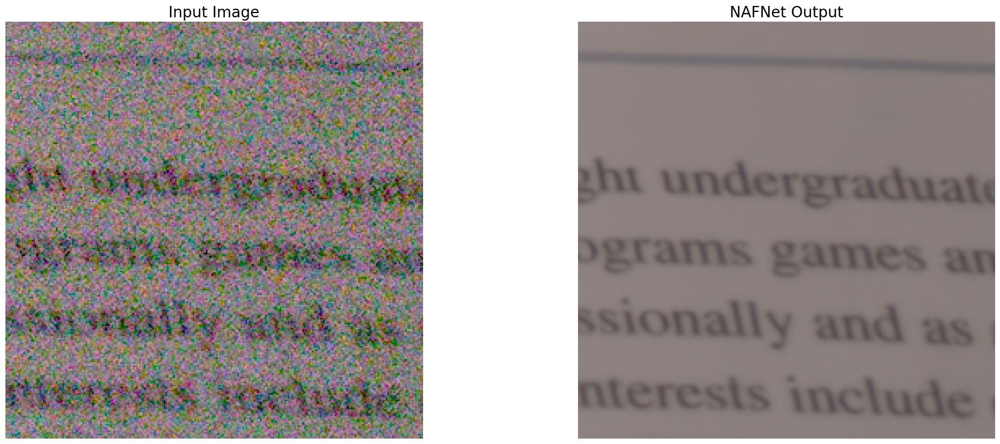

In [10]:
input_path = 'demo_input/noisy-demo-0.png'
output_path = 'demo_output/noisy-demo-0.png'

img_input = img_read (input_path)
inp = img_2tensor (img_input)
single_image_infer (NAFNet, inp, output_path)
img_output = img_read (output_path)
display (img_input, img_output)

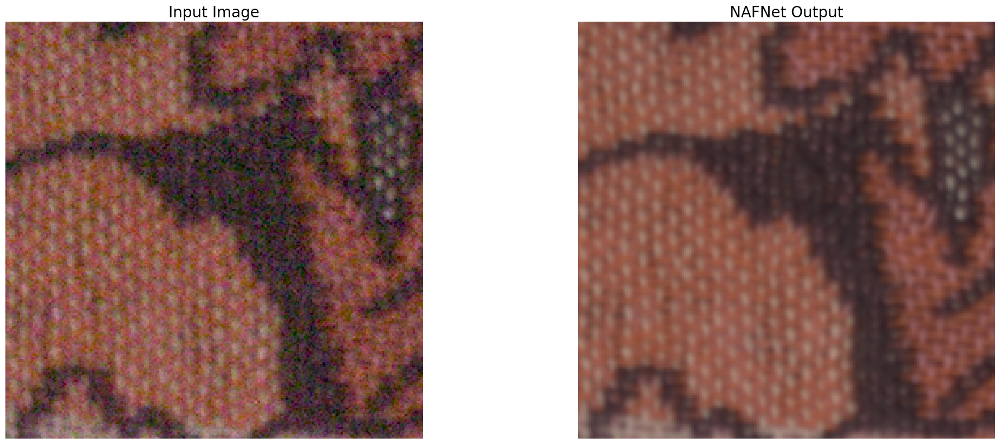

In [11]:
input_path = 'demo_input/noisy-demo-1.png'
output_path = 'demo_output/noisy-demo-1.png'

img_input = img_read (input_path)
inp = img_2tensor (img_input)
single_image_infer (NAFNet, inp, output_path)
img_output = img_read(output_path)
display(img_input, img_output)

## Denoising Uploaded Images

In [12]:
denoise_input_fldr = 'upload/denoise_input'
denoise_output_fldr = 'upload/denoise_output'

if os.path.isdir (denoise_input_fldr):       # Checks if the folder exists, and recursively deletes it
   shutil.rmtree (denoise_input_fldr)
if os.path.isdir (denoise_output_fldr):
   shutil.rmtree (denoise_output_fldr)
os.makedirs (denoise_input_fldr)
os.makedirs (denoise_output_fldr)

# Uploading images
folder = files.upload()
for file in folder.keys():
  destination = os.path.join (denoise_input_fldr, file)
  print (f'move {file} to {destination}')
  shutil.move (file, destination)

Saving denoise2.jpeg to denoise2.jpeg
move denoise2.jpeg to upload/denoise_input/denoise2.jpeg


In [13]:
input_list = sorted(glob.glob(os.path.join(denoise_input_fldr, '*')))
for input_path in input_list:
  img_input = img_read(input_path)
  inp = img_2tensor(img_input)
  output_path = os.path.join(denoise_output_fldr, os.path.basename(input_path))
  single_image_infer (NAFNet, inp, output_path)

output_list = sorted(glob.glob(os.path.join(denoise_output_fldr, '*')))
for input_path, output_path in zip(input_list, output_list):
  img_input = img_read(input_path)
  img_output = img_read(output_path)
  display(img_input, img_output)

Output hidden; open in https://colab.research.google.com to view.

## Deblurring Results

In [14]:
opt_path = 'options/test/REDS/NAFNet-width64.yml'
opt = parse(opt_path, is_train=False)
opt['dist'] = False
opt['num_gpu'] = 0
NAFNet = create_model(opt)

 load net keys <built-in method keys of dict object at 0x7b70f1780080>


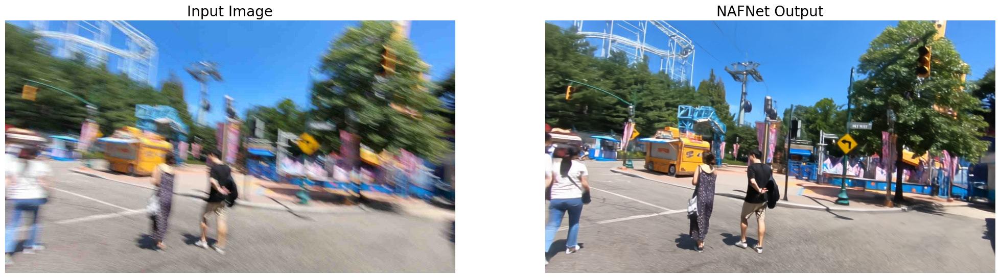

In [15]:
input_path = 'demo_input/blurry-reds-0.jpg'
output_path = 'demo_output/blurry-reds-0.jpg'

img_input = img_read (input_path)
inp = img_2tensor (img_input)
single_image_infer (NAFNet, inp, output_path)
img_output = img_read (output_path)
display (img_input, img_output)

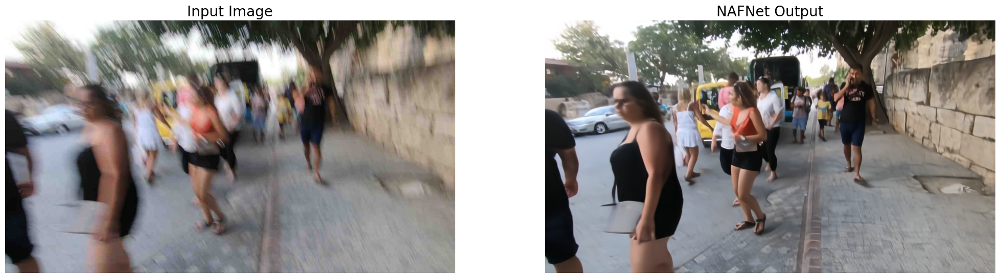

In [16]:
input_path = 'demo_input/blurry-reds-1.jpg'
output_path = 'demo_output/blurry-reds-1.jpg'

img_input = img_read (input_path)
inp = img_2tensor (img_input)
single_image_infer (NAFNet, inp, output_path)
img_output = img_read (output_path)
display (img_input, img_output)

## Deblurring Uploaded Images

In [17]:
deblur_input_fldr = 'upload/deblur_input'
deblur_output_fldr = 'upload/deblur_output'

if os.path.isdir (deblur_input_fldr):       # Checks if the folder exists, and recursively deletes it
   shutil.rmtree (deblur_input_fldr)
if os.path.isdir (deblur_output_fldr):
   shutil.rmtree (deblur_output_fldr)
os.makedirs (deblur_input_fldr)
os.makedirs (deblur_output_fldr)

# Uploading images
folder = files.upload()
for file in folder.keys():
  destination = os.path.join (deblur_input_fldr, file)
  shutil.move (file, destination)

Saving blur.jpg to blur.jpg


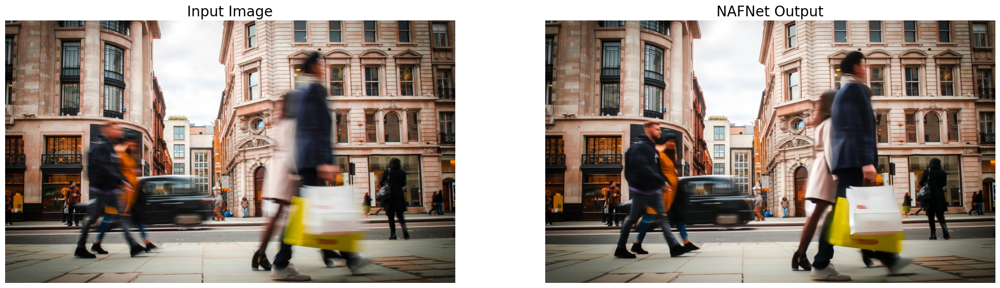

In [18]:
input_list = sorted (glob.glob(os.path.join(deblur_input_fldr, '*')))
for input_path in input_list:
  img_input = img_read (input_path)
  inp = img_2tensor (img_input)
  output_path = os.path.join(deblur_output_fldr, os.path.basename(input_path))
  single_image_infer (NAFNet, inp, output_path)

output_list = sorted(glob.glob(os.path.join(deblur_output_fldr, '*')))
for input_path, output_path in zip(input_list, output_list):
  img_input = img_read (input_path)
  img_output = img_read (output_path)
  display (img_input, img_output)

## Image Utility Functions for Stereo Super Resolution

In [21]:
def img_read (img_path):
  img = cv2.imread(img_path)
  img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
  return img

def img_2tensor (img, bgr2rgb = False, float32 = True):
    img = img.astype(np.float32) / 255.
    return _img2tensor(img, bgr2rgb=bgr2rgb, float32=float32)

def display_img (LR_l, LR_r, SR_l, SR_r):
  h,w = SR_l.shape[:2]
  LR_l = cv2.resize(LR_l, (w,h), interpolation=cv2.INTER_CUBIC)
  LR_r = cv2.resize(LR_r, (w,h), interpolation=cv2.INTER_CUBIC)
  fig = plt.figure(figsize=(w//40, h//40))
  ax1 = fig.add_subplot(2, 2, 1)
  plt.title('Input Image (Left)', fontsize = 20)
  ax1.axis('off')
  ax2 = fig.add_subplot(2, 2, 2)
  plt.title('NAFSSR Output (Left)', fontsize = 20)
  ax2.axis('off')
  ax1.imshow(LR_l)
  ax2.imshow(SR_l)

  ax3 = fig.add_subplot(2, 2, 3)
  plt.title('Input Image (Right)', fontsize = 20)
  ax3.axis('off')
  ax4 = fig.add_subplot(2, 2, 4)
  plt.title('NAFSSR Output (Right)', fontsize = 20)
  ax4.axis('off')
  ax3.imshow(LR_r)
  ax4.imshow(SR_r)

  plt.subplots_adjust (wspace=0.04, hspace=0.04)

def stereo_image_infer (model, img_l, img_r, save_path):
      img = torch.cat([img_l, img_r], dim=0)
      model.feed_data(data={'lq': img.unsqueeze(dim=0)})

      if model.opt['val'].get('grids', False):
          model.grids()

      model.test()

      if model.opt['val'].get('grids', False):
          model.grids_inverse()

      visuals = model.get_current_visuals()
      img_L = visuals['result'][:,:3]
      img_R = visuals['result'][:,3:]
      img_L, img_R = tensor2img([img_L, img_R])

      imwrite (img_L, save_path.format('L'))
      imwrite (img_R, save_path.format('R'))


In [20]:
opt_path = 'options/test/NAFSSR/NAFSSR-L_4x.yml'
opt = parse(opt_path, is_train=False)
opt['dist'] = False
opt['num_gpu'] = 0
NAFSSR = create_model(opt)

 load net keys <built-in method keys of dict object at 0x7b710b12ae40>


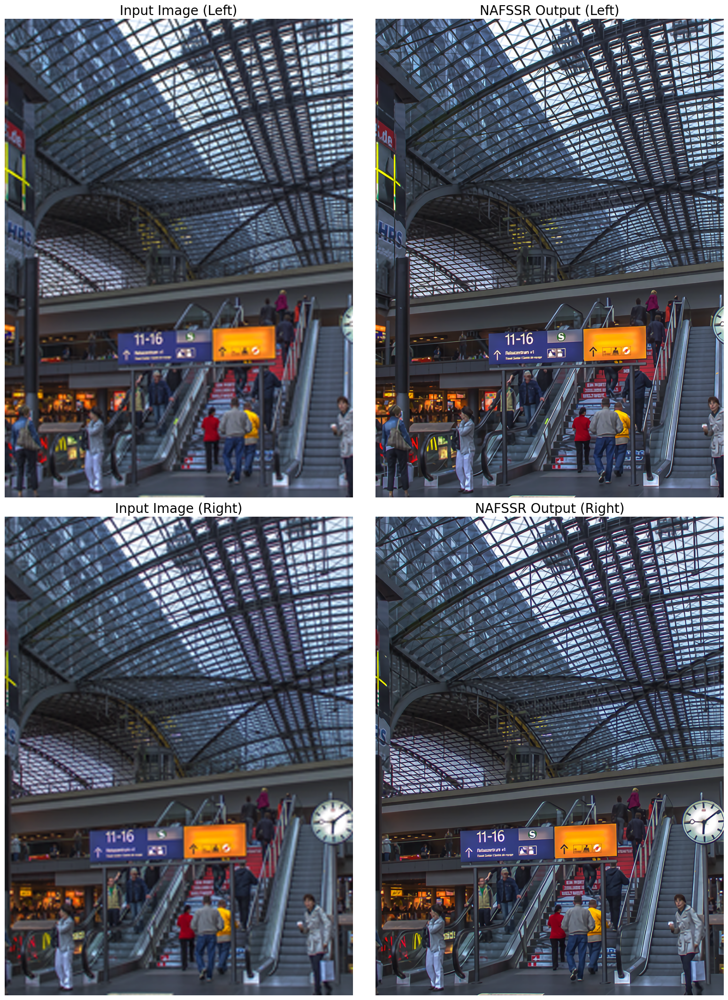

In [22]:
input_left = 'demo_imgs/Flickr1024_lr_x4_0035_l.png'
input_right = 'demo_imgs/Flickr1024_lr_x4_0035_r.png'
output_path = 'demo_output/Flickr1024_sr_x4_0035_{}.png'

img_l = img_read (input_left)
inp_l = img_2tensor (img_l)
img_r = img_read (input_right)
inp_r = img_2tensor (img_r)
stereo_image_infer (NAFSSR, inp_l, inp_r, output_path)
SR_l = img_read (output_path.format('L'))
SR_r = img_read (output_path.format('R'))
display_img (img_l, img_r, SR_l, SR_r)